# BITS NLP GROUP 110 : Assignment 1

## Problem Statement

I am a person looking for options to sell my products online, using platforms like Amazon. Right now I am not clear regarding what are the best products to invest in if I consider myself as a small investor (willing to invest up to 5 lakh Rupees) and so it is quite obvious I consider myself as a risk-averse investor.

I wish to perform sentiment analysis for product reviews from, say, Amazon, to select the best possible products for me.

Expected Answer:

Suggest Top five products for the investment bracket, with a detailed report using sentimental analysis on those product reviews.

## Dataset Used

### Amazon product review data

#### Health_and_Personal_Care

http://jmcauley.ucsd.edu/data/amazon/links.html

### Name : Narendra Narayan Kalekar 2020FC04382
### Group Number : 110
### Group Details : 

Full Name|BITS ID
---------|-------
Narendra Narayan Kalekar	| 2020FC04382
Rahil Sharma |	2020FC04393
Anwer Ali Mohamed | 2020FC04705

## Import Libraries

In [1]:
import pandas as pd
import gzip
import matplotlib.pyplot as plt
import numpy as np
import itertools
import re, string, unicodedata
import nltk

from bs4 import BeautifulSoup
from nltk import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem.lancaster import LancasterStemmer
from nltk.stem import WordNetLemmatizer


from wordcloud import WordCloud,STOPWORDS
import sklearn 
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import BernoulliNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
import seaborn as sns

## Importing the dataset

In [2]:
def parse(path):
  g = gzip.open(path, 'rb')
  for l in g:
    yield eval(l)

def getDF(path):
  i = 0
  df = {}
  for d in parse(path):
    df[i] = d
    i += 1
  return pd.DataFrame.from_dict(df, orient='index')

In [3]:
review_df = getDF('reviews_Health_and_Personal_Care_5.json.gz')
metadata_df = getDF('meta_Health_and_Personal_Care.json.gz')

In [4]:
print ("Total data:", str(review_df.shape))
review_df.info()
review_df.head()

Total data: (346355, 9)
<class 'pandas.core.frame.DataFrame'>
Int64Index: 346355 entries, 0 to 346354
Data columns (total 9 columns):
reviewerID        346355 non-null object
asin              346355 non-null object
reviewerName      343304 non-null object
helpful           346355 non-null object
reviewText        346355 non-null object
overall           346355 non-null float64
summary           346355 non-null object
unixReviewTime    346355 non-null int64
reviewTime        346355 non-null object
dtypes: float64(1), int64(1), object(7)
memory usage: 26.4+ MB


,reviewerID,asin,reviewerName,helpful,reviewText,overall,summary,unixReviewTime,reviewTime
0,ALC5GH8CAMAI7,159985130X,AnnN,"[1, 1]",This is a great little gadget to have around. ...,5.0,Handy little gadget,1294185600,"01 5, 2011"
1,AHKSURW85PJUE,159985130X,"AZ buyer ""AZ buyer""","[1, 1]",I would recommend this for a travel magnifier ...,4.0,Small & may need to encourage battery,1329523200,"02 18, 2012"
2,A38RMU1Y5TDP9,159985130X,"Bob Tobias ""Robert Tobias""","[75, 77]",What I liked was the quality of the lens and t...,4.0,Very good but not great,1275955200,"06 8, 2010"
3,A1XZUG7DFXXOS4,159985130X,Cat lover,"[56, 60]",Love the Great point light pocket magnifier! ...,4.0,great addition to your purse,1202428800,"02 8, 2008"
4,A1MS3M7M7AM13X,159985130X,Cricketoes,"[1, 1]",This is very nice. You pull out on the magnifi...,5.0,Very nice and convenient.,1313452800,"08 16, 2011"


In [5]:
print ("Total metadata:", str(metadata_df.shape))
metadata_df.info()
metadata_df.head()

Total metadata: (263032, 9)
<class 'pandas.core.frame.DataFrame'>
Int64Index: 263032 entries, 0 to 263031
Data columns (total 9 columns):
asin           263032 non-null object
description    237839 non-null object
title          262362 non-null object
imUrl          262767 non-null object
related        208364 non-null object
salesRank      247665 non-null object
categories     263032 non-null object
price          196043 non-null float64
brand          124304 non-null object
dtypes: float64(1), object(8)
memory usage: 20.1+ MB


,asin,description,title,imUrl,related,salesRank,categories,price,brand
0,0077614992,This is an example product description.,Principles of Mgmt + Oper-CSUF Custom C,http://ecx.images-amazon.com/images/I/51G%2BRq...,"{'also_bought': ['0471730726', '0132834871', '...",{'Health & Personal Care': 168429},[[Health & Personal Care]],NaN,NaN
1,0615208479,By now we all know the benefits of exercise fo...,Brain Fitness Exercises Software,http://ecx.images-amazon.com/images/I/41kbZB04...,NaN,{'Health & Personal Care': 1346973},"[[Health & Personal Care, Personal Care]]",NaN,NaN
2,0615269990,What's wrong with your patient?Do all the symp...,Occam's Razor,http://ecx.images-amazon.com/images/I/51fH-ABe...,"{'also_bought': ['1935660152', '0071743979', '...",{'Toys & Games': 110575},"[[Health & Personal Care, Personal Care, Shavi...",34.99,NaN
3,0615315860,NaN,101 BlenderBottle Recipes Quick and Easy,http://ecx.images-amazon.com/images/I/21zOQu2Q...,"{'also_bought': ['B006VT9RBM', 'B0010JLMO8', '...",{'Health & Personal Care': 254068},[[Health & Personal Care]],NaN,NaN
4,0615406394,This is an example product description.,"Aphrodite Reborn - Women's Stories of Hope, Co...",http://ecx.images-amazon.com/images/I/51rJLgsi...,"{'also_bought': ['0966035232', '1421407205']}",{'Health & Personal Care': 377936},[[Health & Personal Care]],NaN,NaN


## Preprocessing and cleaning

In [6]:
review_df.isnull().sum()

reviewerID           0
asin                 0
reviewerName      3051
helpful              0
reviewText           0
overall              0
summary              0
unixReviewTime       0
reviewTime           0
dtype: int64

In [7]:
metadata_df.isnull().sum()

asin                0
description     25193
title             670
imUrl             265
related         54668
salesRank       15367
categories          0
price           66989
brand          138728
dtype: int64

In [8]:
# MERGE
product_reviews_df=pd.merge(review_df,metadata_df,on='asin',how='left')

In [9]:
print ("Total products with reviews:", str(product_reviews_df.shape))
product_reviews_df.info()
product_reviews_df.head()

Total products with reviews: (346355, 17)
<class 'pandas.core.frame.DataFrame'>
Int64Index: 346355 entries, 0 to 346354
Data columns (total 17 columns):
reviewerID        346355 non-null object
asin              346355 non-null object
reviewerName      343304 non-null object
helpful           346355 non-null object
reviewText        346355 non-null object
overall           346355 non-null float64
summary           346355 non-null object
unixReviewTime    346355 non-null int64
reviewTime        346355 non-null object
description       340043 non-null object
title             345170 non-null object
imUrl             345815 non-null object
related           342300 non-null object
salesRank         333298 non-null object
categories        346355 non-null object
price             326116 non-null float64
brand             269468 non-null object
dtypes: float64(2), int64(1), object(14)
memory usage: 47.6+ MB


,reviewerID,asin,reviewerName,helpful,reviewText,overall,summary,unixReviewTime,reviewTime,description,title,imUrl,related,salesRank,categories,price,brand
0,ALC5GH8CAMAI7,159985130X,AnnN,"[1, 1]",This is a great little gadget to have around. ...,5.0,Handy little gadget,1294185600,"01 5, 2011","The Pocket Magnifier is so popular, we are hav...","Lightwedge Lighted Pocket Magnifier, Plum",http://ecx.images-amazon.com/images/I/31eVZtZ%...,"{'also_bought': ['B002DGPUM2', 'B00524H8MC', '...",NaN,"[[Health & Personal Care, Medical Supplies & E...",24.95,NaN
1,AHKSURW85PJUE,159985130X,"AZ buyer ""AZ buyer""","[1, 1]",I would recommend this for a travel magnifier ...,4.0,Small & may need to encourage battery,1329523200,"02 18, 2012","The Pocket Magnifier is so popular, we are hav...","Lightwedge Lighted Pocket Magnifier, Plum",http://ecx.images-amazon.com/images/I/31eVZtZ%...,"{'also_bought': ['B002DGPUM2', 'B00524H8MC', '...",NaN,"[[Health & Personal Care, Medical Supplies & E...",24.95,NaN
2,A38RMU1Y5TDP9,159985130X,"Bob Tobias ""Robert Tobias""","[75, 77]",What I liked was the quality of the lens and t...,4.0,Very good but not great,1275955200,"06 8, 2010","The Pocket Magnifier is so popular, we are hav...","Lightwedge Lighted Pocket Magnifier, Plum",http://ecx.images-amazon.com/images/I/31eVZtZ%...,"{'also_bought': ['B002DGPUM2', 'B00524H8MC', '...",NaN,"[[Health & Personal Care, Medical Supplies & E...",24.95,NaN
3,A1XZUG7DFXXOS4,159985130X,Cat lover,"[56, 60]",Love the Great point light pocket magnifier! ...,4.0,great addition to your purse,1202428800,"02 8, 2008","The Pocket Magnifier is so popular, we are hav...","Lightwedge Lighted Pocket Magnifier, Plum",http://ecx.images-amazon.com/images/I/31eVZtZ%...,"{'also_bought': ['B002DGPUM2', 'B00524H8MC', '...",NaN,"[[Health & Personal Care, Medical Supplies & E...",24.95,NaN
4,A1MS3M7M7AM13X,159985130X,Cricketoes,"[1, 1]",This is very nice. You pull out on the magnifi...,5.0,Very nice and convenient.,1313452800,"08 16, 2011","The Pocket Magnifier is so popular, we are hav...","Lightwedge Lighted Pocket Magnifier, Plum",http://ecx.images-amazon.com/images/I/31eVZtZ%...,"{'also_bought': ['B002DGPUM2', 'B00524H8MC', '...",NaN,"[[Health & Personal Care, Medical Supplies & E...",24.95,NaN


In [10]:
product_reviews_df.isnull().sum()

reviewerID            0
asin                  0
reviewerName       3051
helpful               0
reviewText            0
overall               0
summary               0
unixReviewTime        0
reviewTime            0
description        6312
title              1185
imUrl               540
related            4055
salesRank         13057
categories            0
price             20239
brand             76887
dtype: int64

In [11]:
# DROP NULL VALUES IN PRODUCT TITLE COLUMN IN PANDAS

product_reviews_df=product_reviews_df.dropna(subset=['title'])

In [12]:
print ("Total products with reviews after removing null titles:", str(product_reviews_df.shape))
product_reviews_df.info()
product_reviews_df.head()

Total products with reviews after removing null titles: (345170, 17)
<class 'pandas.core.frame.DataFrame'>
Int64Index: 345170 entries, 0 to 346354
Data columns (total 17 columns):
reviewerID        345170 non-null object
asin              345170 non-null object
reviewerName      342125 non-null object
helpful           345170 non-null object
reviewText        345170 non-null object
overall           345170 non-null float64
summary           345170 non-null object
unixReviewTime    345170 non-null int64
reviewTime        345170 non-null object
description       339416 non-null object
title             345170 non-null object
imUrl             345170 non-null object
related           341626 non-null object
salesRank         332681 non-null object
categories        345170 non-null object
price             325490 non-null float64
brand             269468 non-null object
dtypes: float64(2), int64(1), object(14)
memory usage: 47.4+ MB


,reviewerID,asin,reviewerName,helpful,reviewText,overall,summary,unixReviewTime,reviewTime,description,title,imUrl,related,salesRank,categories,price,brand
0,ALC5GH8CAMAI7,159985130X,AnnN,"[1, 1]",This is a great little gadget to have around. ...,5.0,Handy little gadget,1294185600,"01 5, 2011","The Pocket Magnifier is so popular, we are hav...","Lightwedge Lighted Pocket Magnifier, Plum",http://ecx.images-amazon.com/images/I/31eVZtZ%...,"{'also_bought': ['B002DGPUM2', 'B00524H8MC', '...",NaN,"[[Health & Personal Care, Medical Supplies & E...",24.95,NaN
1,AHKSURW85PJUE,159985130X,"AZ buyer ""AZ buyer""","[1, 1]",I would recommend this for a travel magnifier ...,4.0,Small & may need to encourage battery,1329523200,"02 18, 2012","The Pocket Magnifier is so popular, we are hav...","Lightwedge Lighted Pocket Magnifier, Plum",http://ecx.images-amazon.com/images/I/31eVZtZ%...,"{'also_bought': ['B002DGPUM2', 'B00524H8MC', '...",NaN,"[[Health & Personal Care, Medical Supplies & E...",24.95,NaN
2,A38RMU1Y5TDP9,159985130X,"Bob Tobias ""Robert Tobias""","[75, 77]",What I liked was the quality of the lens and t...,4.0,Very good but not great,1275955200,"06 8, 2010","The Pocket Magnifier is so popular, we are hav...","Lightwedge Lighted Pocket Magnifier, Plum",http://ecx.images-amazon.com/images/I/31eVZtZ%...,"{'also_bought': ['B002DGPUM2', 'B00524H8MC', '...",NaN,"[[Health & Personal Care, Medical Supplies & E...",24.95,NaN
3,A1XZUG7DFXXOS4,159985130X,Cat lover,"[56, 60]",Love the Great point light pocket magnifier! ...,4.0,great addition to your purse,1202428800,"02 8, 2008","The Pocket Magnifier is so popular, we are hav...","Lightwedge Lighted Pocket Magnifier, Plum",http://ecx.images-amazon.com/images/I/31eVZtZ%...,"{'also_bought': ['B002DGPUM2', 'B00524H8MC', '...",NaN,"[[Health & Personal Care, Medical Supplies & E...",24.95,NaN
4,A1MS3M7M7AM13X,159985130X,Cricketoes,"[1, 1]",This is very nice. You pull out on the magnifi...,5.0,Very nice and convenient.,1313452800,"08 16, 2011","The Pocket Magnifier is so popular, we are hav...","Lightwedge Lighted Pocket Magnifier, Plum",http://ecx.images-amazon.com/images/I/31eVZtZ%...,"{'also_bought': ['B002DGPUM2', 'B00524H8MC', '...",NaN,"[[Health & Personal Care, Medical Supplies & E...",24.95,NaN


In [13]:
product_reviews_df.isnull().sum()

reviewerID            0
asin                  0
reviewerName       3045
helpful               0
reviewText            0
overall               0
summary               0
unixReviewTime        0
reviewTime            0
description        5754
title                 0
imUrl                 0
related            3544
salesRank         12489
categories            0
price             19680
brand             75702
dtype: int64

In [14]:
# FILLING NULL VALUES IN BRAND NAME WITH FIRST WORD FROM TITLE

product_reviews_df.loc[product_reviews_df.brand.isnull(),'brand'] = product_reviews_df.title.str.split().str.get(0)

In [15]:
product_reviews_df.isnull().sum()

reviewerID            0
asin                  0
reviewerName       3045
helpful               0
reviewText            0
overall               0
summary               0
unixReviewTime        0
reviewTime            0
description        5754
title                 0
imUrl                 0
related            3544
salesRank         12489
categories            0
price             19680
brand                 0
dtype: int64

In [16]:
# DROPPING IRRELAVENT COLUMNS

product_reviews_df=product_reviews_df.drop(columns=['salesRank','imUrl','related'],axis=1)

In [17]:
product_reviews_df.isnull().sum()

reviewerID            0
asin                  0
reviewerName       3045
helpful               0
reviewText            0
overall               0
summary               0
unixReviewTime        0
reviewTime            0
description        5754
title                 0
categories            0
price             19680
brand                 0
dtype: int64

In [18]:
print ("Total products with reviews after removing null columns:", str(product_reviews_df.shape))
product_reviews_df.info()
product_reviews_df.head()

Total products with reviews after removing null columns: (345170, 14)
<class 'pandas.core.frame.DataFrame'>
Int64Index: 345170 entries, 0 to 346354
Data columns (total 14 columns):
reviewerID        345170 non-null object
asin              345170 non-null object
reviewerName      342125 non-null object
helpful           345170 non-null object
reviewText        345170 non-null object
overall           345170 non-null float64
summary           345170 non-null object
unixReviewTime    345170 non-null int64
reviewTime        345170 non-null object
description       339416 non-null object
title             345170 non-null object
categories        345170 non-null object
price             325490 non-null float64
brand             345170 non-null object
dtypes: float64(2), int64(1), object(11)
memory usage: 49.5+ MB


,reviewerID,asin,reviewerName,helpful,reviewText,overall,summary,unixReviewTime,reviewTime,description,title,categories,price,brand
0,ALC5GH8CAMAI7,159985130X,AnnN,"[1, 1]",This is a great little gadget to have around. ...,5.0,Handy little gadget,1294185600,"01 5, 2011","The Pocket Magnifier is so popular, we are hav...","Lightwedge Lighted Pocket Magnifier, Plum","[[Health & Personal Care, Medical Supplies & E...",24.95,Lightwedge
1,AHKSURW85PJUE,159985130X,"AZ buyer ""AZ buyer""","[1, 1]",I would recommend this for a travel magnifier ...,4.0,Small & may need to encourage battery,1329523200,"02 18, 2012","The Pocket Magnifier is so popular, we are hav...","Lightwedge Lighted Pocket Magnifier, Plum","[[Health & Personal Care, Medical Supplies & E...",24.95,Lightwedge
2,A38RMU1Y5TDP9,159985130X,"Bob Tobias ""Robert Tobias""","[75, 77]",What I liked was the quality of the lens and t...,4.0,Very good but not great,1275955200,"06 8, 2010","The Pocket Magnifier is so popular, we are hav...","Lightwedge Lighted Pocket Magnifier, Plum","[[Health & Personal Care, Medical Supplies & E...",24.95,Lightwedge
3,A1XZUG7DFXXOS4,159985130X,Cat lover,"[56, 60]",Love the Great point light pocket magnifier! ...,4.0,great addition to your purse,1202428800,"02 8, 2008","The Pocket Magnifier is so popular, we are hav...","Lightwedge Lighted Pocket Magnifier, Plum","[[Health & Personal Care, Medical Supplies & E...",24.95,Lightwedge
4,A1MS3M7M7AM13X,159985130X,Cricketoes,"[1, 1]",This is very nice. You pull out on the magnifi...,5.0,Very nice and convenient.,1313452800,"08 16, 2011","The Pocket Magnifier is so popular, we are hav...","Lightwedge Lighted Pocket Magnifier, Plum","[[Health & Personal Care, Medical Supplies & E...",24.95,Lightwedge


In [19]:
# APPEND REVIEWTEXT WITH SUMMARY 

product_reviews_df['review_text'] = product_reviews_df[['summary', 'reviewText']].apply(lambda x: " ".join(str(y) for y in x if str(y) != 'nan'), axis = 1)
product_reviews_df = product_reviews_df.drop(['reviewText', 'summary'], axis = 1)

In [20]:
product_reviews_df.head()

,reviewerID,asin,reviewerName,helpful,overall,unixReviewTime,reviewTime,description,title,categories,price,brand,review_text
0,ALC5GH8CAMAI7,159985130X,AnnN,"[1, 1]",5.0,1294185600,"01 5, 2011","The Pocket Magnifier is so popular, we are hav...","Lightwedge Lighted Pocket Magnifier, Plum","[[Health & Personal Care, Medical Supplies & E...",24.95,Lightwedge,Handy little gadget This is a great little gad...
1,AHKSURW85PJUE,159985130X,"AZ buyer ""AZ buyer""","[1, 1]",4.0,1329523200,"02 18, 2012","The Pocket Magnifier is so popular, we are hav...","Lightwedge Lighted Pocket Magnifier, Plum","[[Health & Personal Care, Medical Supplies & E...",24.95,Lightwedge,Small & may need to encourage battery I would ...
2,A38RMU1Y5TDP9,159985130X,"Bob Tobias ""Robert Tobias""","[75, 77]",4.0,1275955200,"06 8, 2010","The Pocket Magnifier is so popular, we are hav...","Lightwedge Lighted Pocket Magnifier, Plum","[[Health & Personal Care, Medical Supplies & E...",24.95,Lightwedge,Very good but not great What I liked was the q...
3,A1XZUG7DFXXOS4,159985130X,Cat lover,"[56, 60]",4.0,1202428800,"02 8, 2008","The Pocket Magnifier is so popular, we are hav...","Lightwedge Lighted Pocket Magnifier, Plum","[[Health & Personal Care, Medical Supplies & E...",24.95,Lightwedge,great addition to your purse Love the Great po...
4,A1MS3M7M7AM13X,159985130X,Cricketoes,"[1, 1]",5.0,1313452800,"08 16, 2011","The Pocket Magnifier is so popular, we are hav...","Lightwedge Lighted Pocket Magnifier, Plum","[[Health & Personal Care, Medical Supplies & E...",24.95,Lightwedge,Very nice and convenient. This is very nice. Y...


In [21]:
product_reviews_df['overall'].value_counts()

5.0    210871
4.0     67956
3.0     33157
2.0     16696
1.0     16490
Name: overall, dtype: int64

In [22]:
# Apply the new classification to the ratings column

product_reviews_df['rating'] = product_reviews_df['overall'].apply(lambda x: 'bad' if x < 3 else'good')
#product_reviews_df = product_reviews_df.drop(['overall'], axis = 1)

In [23]:
product_reviews_df.head()

,reviewerID,asin,reviewerName,helpful,overall,unixReviewTime,reviewTime,description,title,categories,price,brand,review_text,rating
0,ALC5GH8CAMAI7,159985130X,AnnN,"[1, 1]",5.0,1294185600,"01 5, 2011","The Pocket Magnifier is so popular, we are hav...","Lightwedge Lighted Pocket Magnifier, Plum","[[Health & Personal Care, Medical Supplies & E...",24.95,Lightwedge,Handy little gadget This is a great little gad...,good
1,AHKSURW85PJUE,159985130X,"AZ buyer ""AZ buyer""","[1, 1]",4.0,1329523200,"02 18, 2012","The Pocket Magnifier is so popular, we are hav...","Lightwedge Lighted Pocket Magnifier, Plum","[[Health & Personal Care, Medical Supplies & E...",24.95,Lightwedge,Small & may need to encourage battery I would ...,good
2,A38RMU1Y5TDP9,159985130X,"Bob Tobias ""Robert Tobias""","[75, 77]",4.0,1275955200,"06 8, 2010","The Pocket Magnifier is so popular, we are hav...","Lightwedge Lighted Pocket Magnifier, Plum","[[Health & Personal Care, Medical Supplies & E...",24.95,Lightwedge,Very good but not great What I liked was the q...,good
3,A1XZUG7DFXXOS4,159985130X,Cat lover,"[56, 60]",4.0,1202428800,"02 8, 2008","The Pocket Magnifier is so popular, we are hav...","Lightwedge Lighted Pocket Magnifier, Plum","[[Health & Personal Care, Medical Supplies & E...",24.95,Lightwedge,great addition to your purse Love the Great po...,good
4,A1MS3M7M7AM13X,159985130X,Cricketoes,"[1, 1]",5.0,1313452800,"08 16, 2011","The Pocket Magnifier is so popular, we are hav...","Lightwedge Lighted Pocket Magnifier, Plum","[[Health & Personal Care, Medical Supplies & E...",24.95,Lightwedge,Very nice and convenient. This is very nice. Y...,good


In [24]:
product_reviews_df['helpful_rate'] = product_reviews_df['helpful'].apply(lambda x: 0.0 if x[1] == 0 else x[0]/x[1])
product_reviews_df = product_reviews_df.drop(['helpful'], axis = 1)

In [25]:
product_reviews_df.head()

,reviewerID,asin,reviewerName,overall,unixReviewTime,reviewTime,description,title,categories,price,brand,review_text,rating,helpful_rate
0,ALC5GH8CAMAI7,159985130X,AnnN,5.0,1294185600,"01 5, 2011","The Pocket Magnifier is so popular, we are hav...","Lightwedge Lighted Pocket Magnifier, Plum","[[Health & Personal Care, Medical Supplies & E...",24.95,Lightwedge,Handy little gadget This is a great little gad...,good,1.000000
1,AHKSURW85PJUE,159985130X,"AZ buyer ""AZ buyer""",4.0,1329523200,"02 18, 2012","The Pocket Magnifier is so popular, we are hav...","Lightwedge Lighted Pocket Magnifier, Plum","[[Health & Personal Care, Medical Supplies & E...",24.95,Lightwedge,Small & may need to encourage battery I would ...,good,1.000000
2,A38RMU1Y5TDP9,159985130X,"Bob Tobias ""Robert Tobias""",4.0,1275955200,"06 8, 2010","The Pocket Magnifier is so popular, we are hav...","Lightwedge Lighted Pocket Magnifier, Plum","[[Health & Personal Care, Medical Supplies & E...",24.95,Lightwedge,Very good but not great What I liked was the q...,good,0.974026
3,A1XZUG7DFXXOS4,159985130X,Cat lover,4.0,1202428800,"02 8, 2008","The Pocket Magnifier is so popular, we are hav...","Lightwedge Lighted Pocket Magnifier, Plum","[[Health & Personal Care, Medical Supplies & E...",24.95,Lightwedge,great addition to your purse Love the Great po...,good,0.933333
4,A1MS3M7M7AM13X,159985130X,Cricketoes,5.0,1313452800,"08 16, 2011","The Pocket Magnifier is so popular, we are hav...","Lightwedge Lighted Pocket Magnifier, Plum","[[Health & Personal Care, Medical Supplies & E...",24.95,Lightwedge,Very nice and convenient. This is very nice. Y...,good,1.000000


In [26]:
# checking duplicates based on'asin', 'reviewName' and 'unixReviewTime'columns

product_reviews_df[product_reviews_df.duplicated(['reviewerName','unixReviewTime','asin'],keep= False)]

,reviewerID,asin,reviewerName,overall,unixReviewTime,reviewTime,description,title,categories,price,brand,review_text,rating,helpful_rate
20762,A438BZ1BBXKA1,B00028NV2E,Jen,5.0,1401753600,"06 3, 2014",Jarro-Dophilus EPS is a Stable-Dophilus due to...,"Jarrow Formulas Jarro-Dophilus EPS, 60 VCaps","[[Health & Personal Care, Vitamins & Dietary S...",15.56,Jarrow,Great Product! Our health starts in our digest...,good,0.0
20763,A3KAINVFTOFY1R,B00028NV2E,Jen,1.0,1401753600,"06 3, 2014",Jarro-Dophilus EPS is a Stable-Dophilus due to...,"Jarrow Formulas Jarro-Dophilus EPS, 60 VCaps","[[Health & Personal Care, Vitamins & Dietary S...",15.56,Jarrow,"Jarrow Formulas This didn't work for me, which...",bad,0.0
36226,A1R25Z3BJ60SZ8,B000AMRII0,NaN,3.0,1371859200,"06 22, 2013",,Philips Sonicare Essence Power Toothbrush,"[[Health & Personal Care, Personal Care, Oral ...",49.89,Philips,"Great use, not durable. I bought this and used...",good,0.0
36251,A577SB6YXZ16G,B000AMRII0,NaN,5.0,1371859200,"06 22, 2013",,Philips Sonicare Essence Power Toothbrush,"[[Health & Personal Care, Personal Care, Oral ...",49.89,Philips,I highly recommend this toothbrush. By FAR the...,good,0.0
45566,A1ZUP7DY7APEW9,B000EZYKTS,NaN,5.0,1225584000,"11 2, 2008",These days women are busier than ever! Since s...,Braun 5270 Xelle Silk-Epil Epilator Model: 5395,"[[Health & Personal Care, Personal Care, Shavi...",59.34,Braun,I will never shave again. This is the best thi...,good,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
346046,A9WO6SOUAHQ8A,B00KVWJ5GC,NaN,5.0,1404000000,"06 29, 2014",YOUR SEARCH FOR THE BEST Digital Infrared (IR)...,TOP Forehead Baby Thermometer - Premium Digita...,"[[Health & Personal Care, Health Care, Thermom...",37.70,TOP,Great non invasive baby thermometer This is a ...,good,0.0
346047,A34LCQPC2BPSHK,B00KVWJ5GC,NaN,5.0,1404086400,"06 30, 2014",YOUR SEARCH FOR THE BEST Digital Infrared (IR)...,TOP Forehead Baby Thermometer - Premium Digita...,"[[Health & Personal Care, Health Care, Thermom...",37.70,TOP,Best method of Monitoring This is a very acura...,good,0.0
346048,A21OFVVU602ODC,B00KVWJ5GC,NaN,5.0,1404345600,"07 3, 2014",YOUR SEARCH FOR THE BEST Digital Infrared (IR)...,TOP Forehead Baby Thermometer - Premium Digita...,"[[Health & Personal Care, Health Care, Thermom...",37.70,TOP,Perfect! This thermometer is a life saver. It ...,good,0.0
346049,A1YMNTFLNDYQ1F,B00KVWJ5GC,NaN,5.0,1404259200,"07 2, 2014",YOUR SEARCH FOR THE BEST Digital Infrared (IR)...,TOP Forehead Baby Thermometer - Premium Digita...,"[[Health & Personal Care, Health Care, Thermom...",37.70,TOP,Very useful and easy to use This was very usef...,good,0.0


In [27]:
#drop the duplicates

product_reviews_df = product_reviews_df.drop_duplicates(['asin','reviewerName', 'unixReviewTime'], keep = 'first')

In [28]:
product_reviews_df.head()

,reviewerID,asin,reviewerName,overall,unixReviewTime,reviewTime,description,title,categories,price,brand,review_text,rating,helpful_rate
0,ALC5GH8CAMAI7,159985130X,AnnN,5.0,1294185600,"01 5, 2011","The Pocket Magnifier is so popular, we are hav...","Lightwedge Lighted Pocket Magnifier, Plum","[[Health & Personal Care, Medical Supplies & E...",24.95,Lightwedge,Handy little gadget This is a great little gad...,good,1.000000
1,AHKSURW85PJUE,159985130X,"AZ buyer ""AZ buyer""",4.0,1329523200,"02 18, 2012","The Pocket Magnifier is so popular, we are hav...","Lightwedge Lighted Pocket Magnifier, Plum","[[Health & Personal Care, Medical Supplies & E...",24.95,Lightwedge,Small & may need to encourage battery I would ...,good,1.000000
2,A38RMU1Y5TDP9,159985130X,"Bob Tobias ""Robert Tobias""",4.0,1275955200,"06 8, 2010","The Pocket Magnifier is so popular, we are hav...","Lightwedge Lighted Pocket Magnifier, Plum","[[Health & Personal Care, Medical Supplies & E...",24.95,Lightwedge,Very good but not great What I liked was the q...,good,0.974026
3,A1XZUG7DFXXOS4,159985130X,Cat lover,4.0,1202428800,"02 8, 2008","The Pocket Magnifier is so popular, we are hav...","Lightwedge Lighted Pocket Magnifier, Plum","[[Health & Personal Care, Medical Supplies & E...",24.95,Lightwedge,great addition to your purse Love the Great po...,good,0.933333
4,A1MS3M7M7AM13X,159985130X,Cricketoes,5.0,1313452800,"08 16, 2011","The Pocket Magnifier is so popular, we are hav...","Lightwedge Lighted Pocket Magnifier, Plum","[[Health & Personal Care, Medical Supplies & E...",24.95,Lightwedge,Very nice and convenient. This is very nice. Y...,good,1.000000


In [29]:
product_reviews_df.shape

(344893, 14)

In [30]:
# drop irrelavent columns
product_reviews_df = product_reviews_df.drop(['unixReviewTime', 'reviewerName'], axis = 1)

In [31]:
# formatting time
product_reviews_df['review_time'] = product_reviews_df.reviewTime.str.replace(',', "")
product_reviews_df['review_time'] = pd.to_datetime(product_reviews_df['review_time'], format = '%m %d %Y')
product_reviews_df = product_reviews_df.drop(['reviewTime'], axis = 1)

In [32]:
product_reviews_df.head()

,reviewerID,asin,overall,description,title,categories,price,brand,review_text,rating,helpful_rate,review_time
0,ALC5GH8CAMAI7,159985130X,5.0,"The Pocket Magnifier is so popular, we are hav...","Lightwedge Lighted Pocket Magnifier, Plum","[[Health & Personal Care, Medical Supplies & E...",24.95,Lightwedge,Handy little gadget This is a great little gad...,good,1.000000,2011-01-05
1,AHKSURW85PJUE,159985130X,4.0,"The Pocket Magnifier is so popular, we are hav...","Lightwedge Lighted Pocket Magnifier, Plum","[[Health & Personal Care, Medical Supplies & E...",24.95,Lightwedge,Small & may need to encourage battery I would ...,good,1.000000,2012-02-18
2,A38RMU1Y5TDP9,159985130X,4.0,"The Pocket Magnifier is so popular, we are hav...","Lightwedge Lighted Pocket Magnifier, Plum","[[Health & Personal Care, Medical Supplies & E...",24.95,Lightwedge,Very good but not great What I liked was the q...,good,0.974026,2010-06-08
3,A1XZUG7DFXXOS4,159985130X,4.0,"The Pocket Magnifier is so popular, we are hav...","Lightwedge Lighted Pocket Magnifier, Plum","[[Health & Personal Care, Medical Supplies & E...",24.95,Lightwedge,great addition to your purse Love the Great po...,good,0.933333,2008-02-08
4,A1MS3M7M7AM13X,159985130X,5.0,"The Pocket Magnifier is so popular, we are hav...","Lightwedge Lighted Pocket Magnifier, Plum","[[Health & Personal Care, Medical Supplies & E...",24.95,Lightwedge,Very nice and convenient. This is very nice. Y...,good,1.000000,2011-08-16


## descriptive statistics and visualization

In [33]:
total = len(product_reviews_df)
print ("Number of reviews: ",total)
print ("Number of unique reviewers: ",len(product_reviews_df.reviewerID.unique()))
print ("Number of unique products: ", len(product_reviews_df.asin.unique()))
print ("Average rating score: ",round(product_reviews_df.overall.mean(),3))
print ("Average helpfull ratio score: ",round(product_reviews_df.helpful_rate.mean(),3))

Number of reviews:  344893
Number of unique reviewers:  38609
Number of unique products:  18483
Average rating score:  4.275
Average helpfull ratio score:  0.328


C:\Users\NA014KA\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


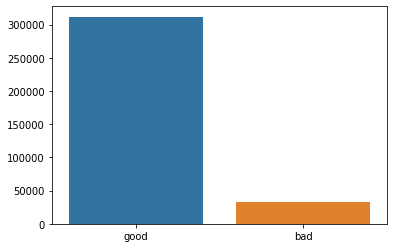

In [34]:
rating = product_reviews_df['rating'].value_counts()
sns.barplot(rating.index, rating.values)

Text(0, 0.5, 'Number of Reviews')

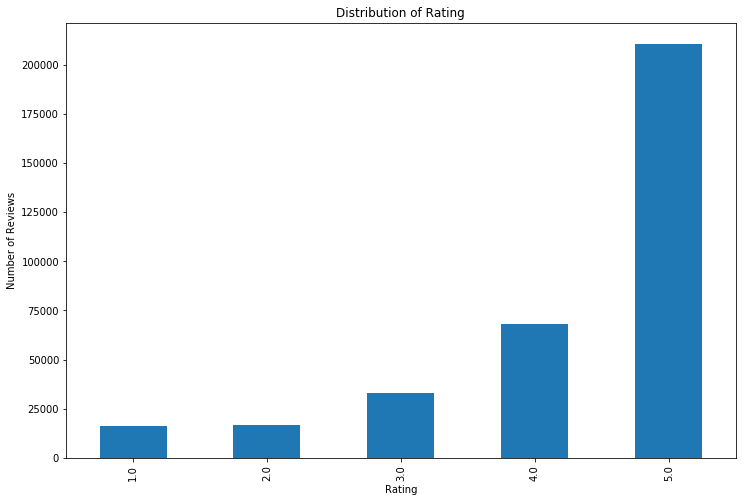

In [35]:
plt.figure(figsize=(12,8))
product_reviews_df['overall'].value_counts().sort_index().plot(kind='bar')
plt.title('Distribution of Rating')
plt.xlabel('Rating')
plt.ylabel('Number of Reviews')

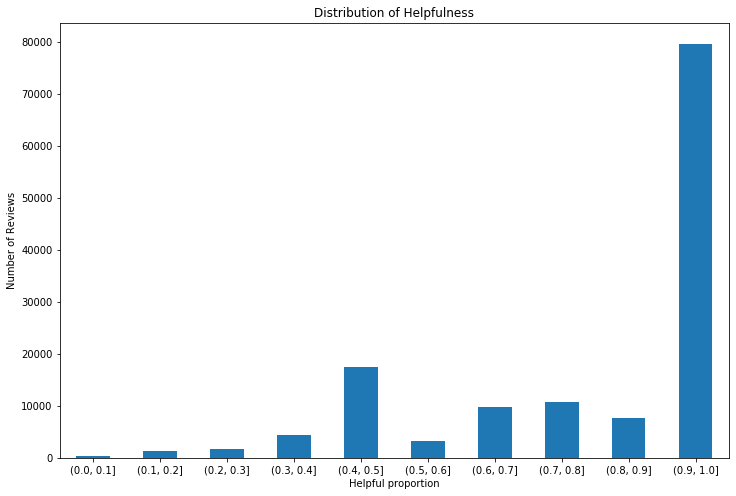

In [36]:
plt.figure(figsize=(12,8))

cutoff = np.array([0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1])


Dist_help = product_reviews_df.groupby([pd.cut(product_reviews_df['helpful_rate'], bins = cutoff)]).size()
Dist_help.plot(kind='bar')

plt.title("Distribution of Helpfulness")
plt.xlabel("Helpful proportion")
plt.ylabel("Number of Reviews")
plt.xticks(rotation=0)
plt.show()

C:\Users\NA014KA\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


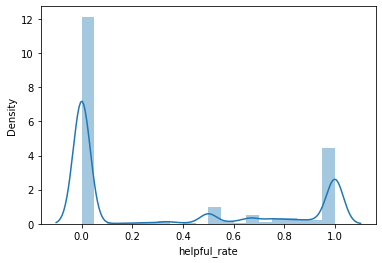

In [37]:
sns.distplot(product_reviews_df['helpful_rate'], bins=20)

In [38]:
product_reviews_df.groupby('overall').size()

overall
1.0     16474
2.0     16688
3.0     33129
4.0     67900
5.0    210702
dtype: int64

## Text Preprocessing

- Removing Special Characters
- Tokenizing Text
- Removing Stopwords
- Correcting Words
- Lemmatization

In [39]:
def strip_html(text):
    soup = BeautifulSoup(text, "html.parser")
    return soup.get_text()


def remove_between_square_brackets(text):
    return re.sub('\[[^]]*\]', '', text)


def denoise_text(text):
    text = strip_html(text)
    text = remove_between_square_brackets(text)
    return text


def remove_special_characters(text, remove_digits=True):
    pattern = r'[^a-zA-z0-9\s]' if not remove_digits else r'[^a-zA-z\s]'
    text = re.sub(pattern, '', text)
    return text


def remove_non_ascii(words):
    new_words = []
    for word in words:
        new_word = unicodedata.normalize('NFKD', word).encode('ascii', 'ignore').decode('utf-8', 'ignore')
        new_words.append(new_word)
    return new_words


def to_lowercase(words):
    new_words = []
    for word in words:
        new_word = word.lower()
        new_words.append(new_word)
    return new_words


def remove_punctuation_and_splchars(words):
    new_words = []
    for word in words:
        new_word = re.sub(r'[^\w\s]', '', word)
        if new_word != '':
            new_word = remove_special_characters(new_word, True)
            new_words.append(new_word)
    return new_words


def replace_numbers(words):
    p = inflect.engine()
    new_words = []
    for word in words:
        if word.isdigit():
            new_word = p.number_to_words(word)
            new_words.append(new_word)
        else:
            new_words.append(word)
    return new_words

stopword_list= stopwords.words('english')
stopword_list.remove('no')
stopword_list.remove('not')


def remove_stopwords(words):
    new_words = []
    for word in words:
        if word not in stopword_list:
            new_words.append(word)
    return new_words


def stem_words(words):
    stemmer = LancasterStemmer()
    stems = []
    for word in words:
        stem = stemmer.stem(word)
        stems.append(stem)
    return stems


def lemmatize_verbs(words):
    lemmatizer = WordNetLemmatizer()
    lemmas = []
    for word in words:
        lemma = lemmatizer.lemmatize(word, pos='v')
        lemmas.append(lemma)
    return lemmas


def normalize(words):
    words = remove_non_ascii(words)
    words = to_lowercase(words)
    words = remove_punctuation_and_splchars(words)
    words = remove_stopwords(words)
    return words


def lemmatize(words):
    lemmas = lemmatize_verbs(words)
    return lemmas


def normalize_and_lemmaize(input):
    sample = denoise_text(input)
    sample = remove_special_characters(sample)
    words = nltk.word_tokenize(sample)
    words = normalize(words)
    lemmas = lemmatize(words)
    return ' '.join(lemmas)

In [40]:
product_reviews_df['clean_text'] = product_reviews_df['review_text'].map(lambda text: normalize_and_lemmaize(text))

In [41]:
product_reviews_df.head()

,reviewerID,asin,overall,description,title,categories,price,brand,review_text,rating,helpful_rate,review_time,clean_text
0,ALC5GH8CAMAI7,159985130X,5.0,"The Pocket Magnifier is so popular, we are hav...","Lightwedge Lighted Pocket Magnifier, Plum","[[Health & Personal Care, Medical Supplies & E...",24.95,Lightwedge,Handy little gadget This is a great little gad...,good,1.000000,2011-01-05,handy little gadget great little gadget around...
1,AHKSURW85PJUE,159985130X,4.0,"The Pocket Magnifier is so popular, we are hav...","Lightwedge Lighted Pocket Magnifier, Plum","[[Health & Personal Care, Medical Supplies & E...",24.95,Lightwedge,Small & may need to encourage battery I would ...,good,1.000000,2012-02-18,small may need encourage battery would recomme...
2,A38RMU1Y5TDP9,159985130X,4.0,"The Pocket Magnifier is so popular, we are hav...","Lightwedge Lighted Pocket Magnifier, Plum","[[Health & Personal Care, Medical Supplies & E...",24.95,Lightwedge,Very good but not great What I liked was the q...,good,0.974026,2010-06-08,good not great like quality lens build light l...
3,A1XZUG7DFXXOS4,159985130X,4.0,"The Pocket Magnifier is so popular, we are hav...","Lightwedge Lighted Pocket Magnifier, Plum","[[Health & Personal Care, Medical Supplies & E...",24.95,Lightwedge,great addition to your purse Love the Great po...,good,0.933333,2008-02-08,great addition purse love great point light po...
4,A1MS3M7M7AM13X,159985130X,5.0,"The Pocket Magnifier is so popular, we are hav...","Lightwedge Lighted Pocket Magnifier, Plum","[[Health & Personal Care, Medical Supplies & E...",24.95,Lightwedge,Very nice and convenient. This is very nice. Y...,good,1.000000,2011-08-16,nice convenient nice pull magnifier want light...


## Wordcloud

In [42]:
good_reviews = product_reviews_df[product_reviews_df['rating'] == 'good'].clean_text
bad_reviews = product_reviews_df[product_reviews_df['rating'] == 'bad'].clean_text

In [43]:
def plot_word_cloud(text):
    wordcloud = WordCloud(
        width = 3000,
        height = 2000,
        background_color = 'black',
        stopwords = STOPWORDS).generate(str(text))
    fig = plt.figure(
        figsize = (40, 30),
        facecolor = 'k',
        edgecolor = 'k')
    plt.imshow(wordcloud, interpolation = 'bilinear')
    plt.axis('off')
    plt.tight_layout(pad=0)
    plt.show()

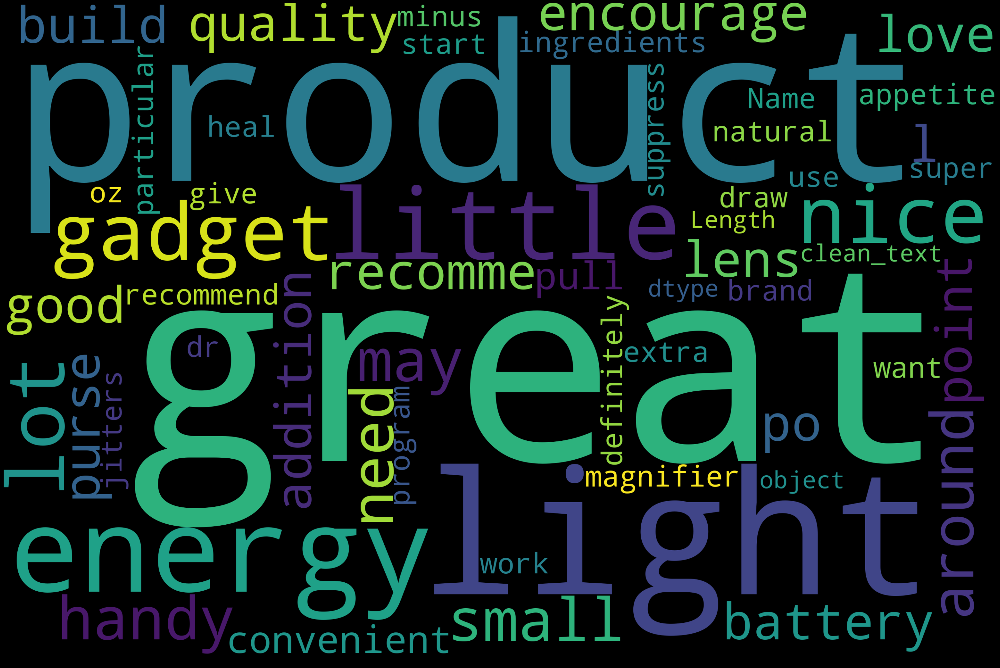

In [44]:
plot_word_cloud(good_reviews)

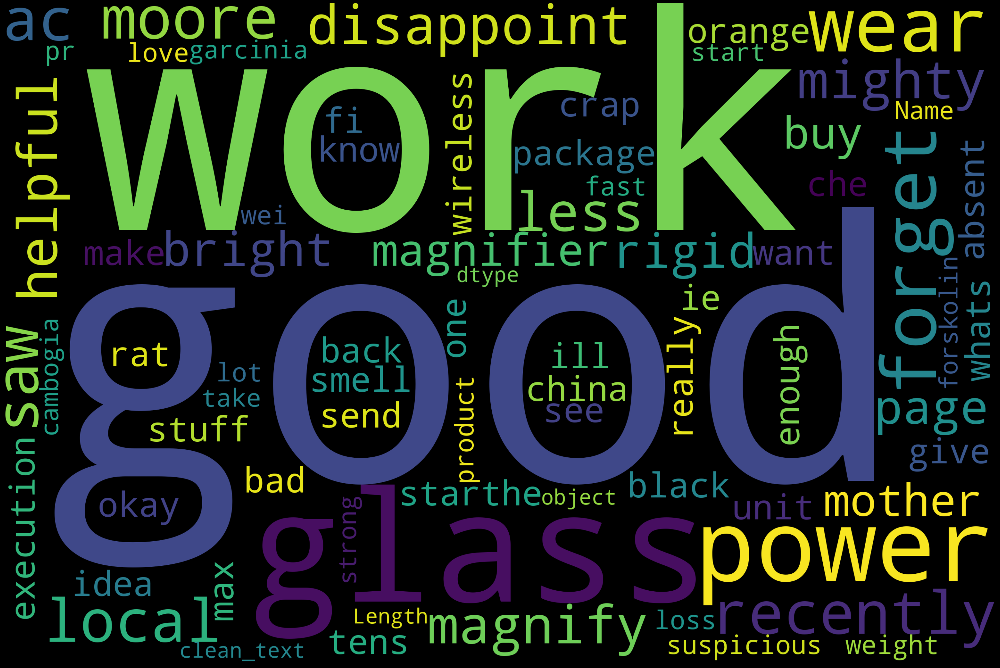

In [45]:
plot_word_cloud(bad_reviews)

## Encoding target variable

In [46]:
product_reviews_df['rating_class'] = product_reviews_df['rating'].apply(lambda x: 0 if x == 'bad' else 1)

In [47]:
X = product_reviews_df['clean_text']
y = product_reviews_df['rating_class']

## TFIDF(Term Frequency — Inverse Document Frequency)

In [48]:
tfidf_vectorizer = TfidfVectorizer(max_features=5000,ngram_range=(2,2))
# TF-IDF feature matrix
X= tfidf_vectorizer.fit_transform(X)

## Train-test split(75:25)

In [49]:
# Splitting Dataset into train and test set 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

# Modeling

In [50]:
def modeling(Model, Xtrain = X_train, Xtest = X_test):
    
    # Instantiate the classifier: model
    model = Model
    
    # Fitting classifier to the Training set (all features)
    model.fit(Xtrain, y_train)
    
    global y_pred
    # Predicting the Test set results
    y_pred = model.predict(Xtest)
    
    # Assign f1 score to a variable
    score = f1_score(y_test, y_pred, average = 'weighted')
    
    # Printing evaluation metric (f1-score) 
    print("f1 score: {}".format(score))

In [51]:
def display_cm(cm):
    plt.style.use('default')
    cm = pd.DataFrame(cm , index = ['BAD','GOOD'] , columns = ['BAD','GOOD'])
    sns.heatmap(cm,cmap= "Greens", linecolor = 'black' , linewidth = 2 , annot = True, fmt='' , xticklabels = ['BAD','GOOD'] , yticklabels = ['BAD','GOOD'])

### Logistic regression

In [52]:
modeling(LogisticRegression(multi_class = 'multinomial', solver = 'newton-cg',
                                     class_weight = 'balanced', C = 0.1, n_jobs = -1, random_state = 42))

# Assign y_pred to a variable for further process
y_pred_cv_logreg = y_pred
print(classification_report(y_test, y_pred_cv_logreg))

f1 score: 0.8660182188950882
              precision    recall  f1-score   support

           0       0.35      0.79      0.49      8294
           1       0.97      0.85      0.91     77930

    accuracy                           0.84     86224
   macro avg       0.66      0.82      0.70     86224
weighted avg       0.91      0.84      0.87     86224



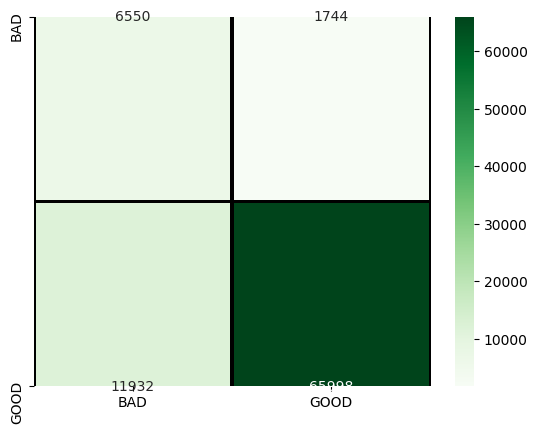

In [53]:
display_cm(confusion_matrix(y_test, y_pred_cv_logreg))

### Random forest classifier

In [54]:
modeling(RandomForestClassifier(n_estimators = 200, random_state = 42))

y_pred_cv_rf = y_pred
print(classification_report(y_test, y_pred_cv_rf))

f1 score: 0.8981960358577731
              precision    recall  f1-score   support

           0       0.68      0.25      0.36      8294
           1       0.92      0.99      0.96     77930

    accuracy                           0.92     86224
   macro avg       0.80      0.62      0.66     86224
weighted avg       0.90      0.92      0.90     86224



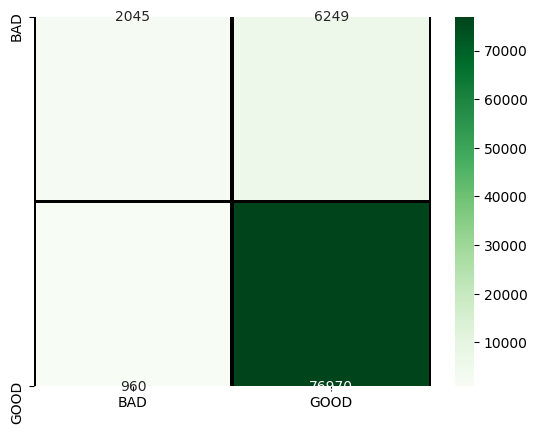

In [55]:
display_cm(confusion_matrix(y_test, y_pred_cv_rf))

### Decision Tree

In [56]:
modeling(DecisionTreeClassifier())

y_pred_dt= y_pred
print(classification_report(y_test, y_pred_dt))

f1 score: 0.8853795816992713
              precision    recall  f1-score   support

           0       0.42      0.32      0.36      8294
           1       0.93      0.95      0.94     77930

    accuracy                           0.89     86224
   macro avg       0.67      0.64      0.65     86224
weighted avg       0.88      0.89      0.89     86224



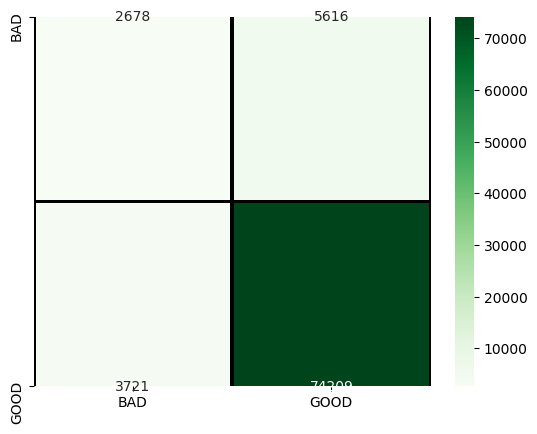

In [57]:
display_cm(confusion_matrix(y_test, y_pred_dt))

### Bernoulli Naive Bayes

In [58]:
modeling(BernoulliNB())

y_pred_nb= y_pred
print(classification_report(y_test, y_pred_nb))

f1 score: 0.9079314908335
              precision    recall  f1-score   support

           0       0.54      0.48      0.51      8294
           1       0.95      0.96      0.95     77930

    accuracy                           0.91     86224
   macro avg       0.74      0.72      0.73     86224
weighted avg       0.91      0.91      0.91     86224



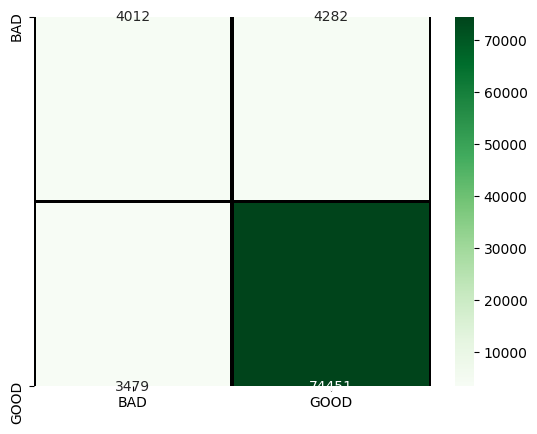

In [59]:
display_cm(confusion_matrix(y_test, y_pred_nb))

### KNN

In [60]:
modeling(KNeighborsClassifier())

y_pred_knn= y_pred
print(classification_report(y_test, y_pred_knn))

f1 score: 0.8755144804489193
              precision    recall  f1-score   support

           0       0.49      0.12      0.19      8294
           1       0.91      0.99      0.95     77930

    accuracy                           0.90     86224
   macro avg       0.70      0.55      0.57     86224
weighted avg       0.87      0.90      0.88     86224



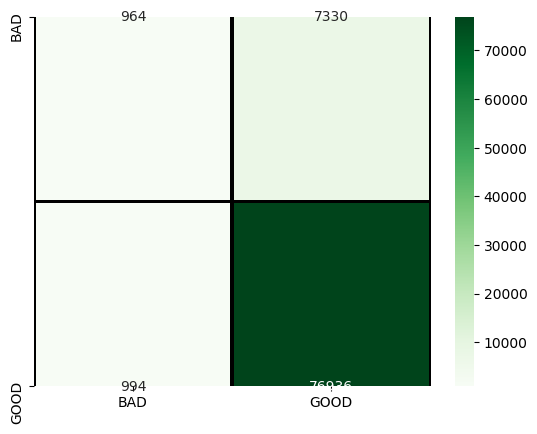

In [61]:
display_cm(confusion_matrix(y_test, y_pred_knn))

#### From the results, we can see Naive Bayes outdone the rest of the algorithms and all the accuracies from the results are more than 80%.

#### Since predicting both positive and negative reviews are important we are considering. We got a pretty good f1 score. 

## Naive Bayes with Hyperparameter tuning

In [62]:
params = {'alpha': [0.01, 0.1, 0.5, 1.0, 10.0],
         }

bernoulli_nb_grid = GridSearchCV(BernoulliNB(), param_grid=params, n_jobs=-1, cv=5, verbose=5)
bernoulli_nb_grid.fit(X,y)

print('Train Accuracy : %.3f'%bernoulli_nb_grid.best_estimator_.score(X_train, y_train))
print('Test Accuracy : %.3f'%bernoulli_nb_grid.best_estimator_.score(X_test, y_test))
print('Best Accuracy Through Grid Search : %.3f'%bernoulli_nb_grid.best_score_)
print('Best Parameters : ',bernoulli_nb_grid.best_params_)

Fitting 5 folds for each of 5 candidates, totalling 25 fits
Train Accuracy : 0.913
Test Accuracy : 0.914
Best Accuracy Through Grid Search : 0.910
Best Parameters :  {'alpha': 0.01}


### We have improved our model to 91.4 % accuracy with adjusting alpha to 0.01

# Products for investment 

In [63]:
# creating overall helpful rate feature
product_reviews_df['overall_helpful_rate'] = product_reviews_df['overall']* product_reviews_df['helpful_rate']

In [64]:
# getting prodcut wise sum of overall helpful rate feature
good_ratings_sum = pd.DataFrame(product_reviews_df[product_reviews_df['rating'] == 'good']
                                .groupby(['asin'])['overall_helpful_rate']
                                .sum())

In [65]:
# sort in non-ascending order to get top 5 only
top_5=good_ratings_sum.sort_values('overall_helpful_rate', ascending = False).head(5)

# merge to get other features of the products
top_5_popular=top_5.merge(product_reviews_df,left_index = True, right_on = 'asin').drop_duplicates(
    ['asin', 'title'])[['asin', 'title','price','categories']]

In [66]:
top_5_popular_with_img =  pd.DataFrame(metadata_df.loc[metadata_df['asin'].isin(top_5_popular['asin'])])

In [67]:
top_5_popular_with_img = top_5_popular_with_img.drop(['related'], axis = 1)

In [68]:
from IPython.display import HTML

def path_to_image(path):
    return '<img src="'+ path + '" style=max-height:124px;"/>'

HTML(top_5_popular_with_img[['asin','imUrl','title']].to_html(escape=False , formatters={'imUrl': path_to_image}))

,asin,imUrl,title
55069,B0013OQGO6,,"Jarrow Formulas Methylcobalamin (Methyl B12), 5000mcg, 60 Lozenges"
72198,B001F0REY4,,"Dropps Laundry Detergent Pacs, Fresh Scent, 20 Loads (Pack of 3)"
108960,B0037KMI0U,,"Tide Original Scent Liquid Laundry Detergent , 50 Fl Oz, 2 Count"
146283,B004YHKUXC,,Tide Pods Laundry Detergent Alpine Breeze Scent 18 Count
179403,B007LEO4Y6,,"Jarrow Formulas Magmind Nutritional Supplement, 90 Count"


In [69]:
top_5_product_reviews_df = pd.DataFrame(product_reviews_df.loc[product_reviews_df['asin'].isin(top_5_popular_with_img['asin'])])

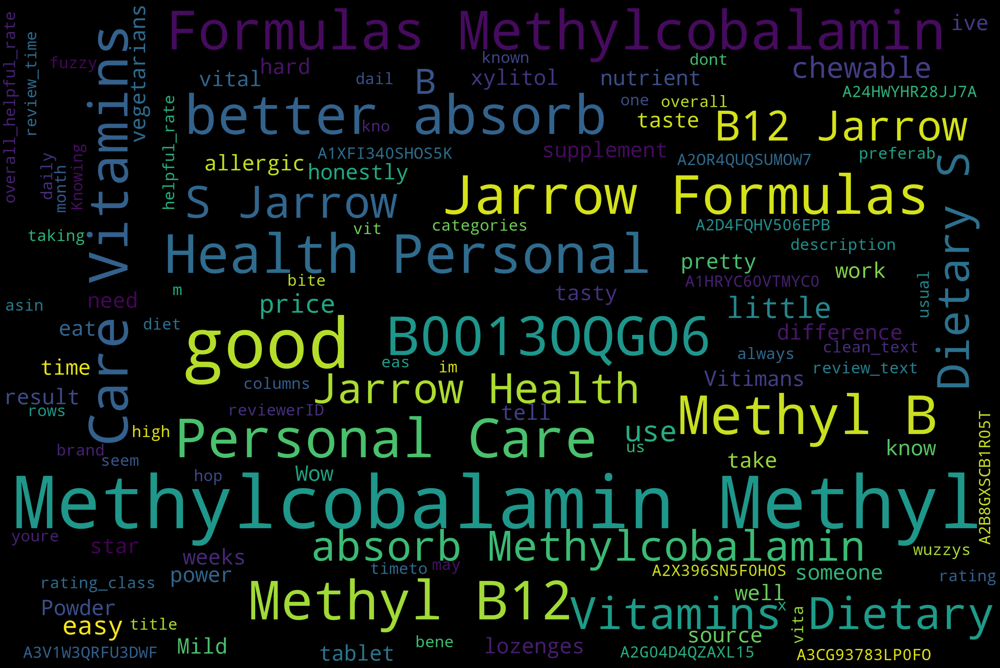

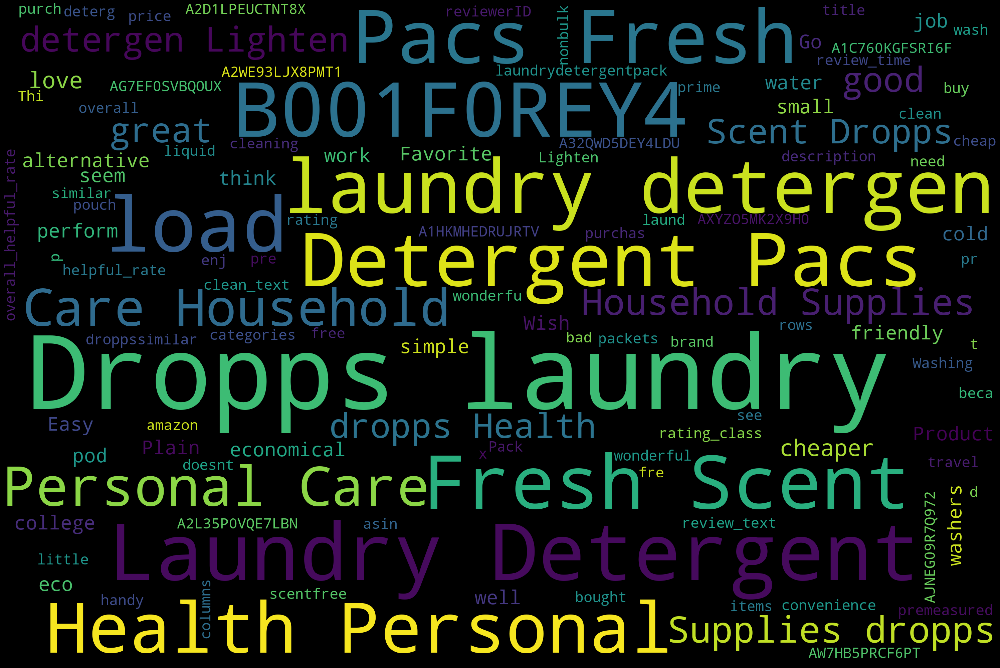

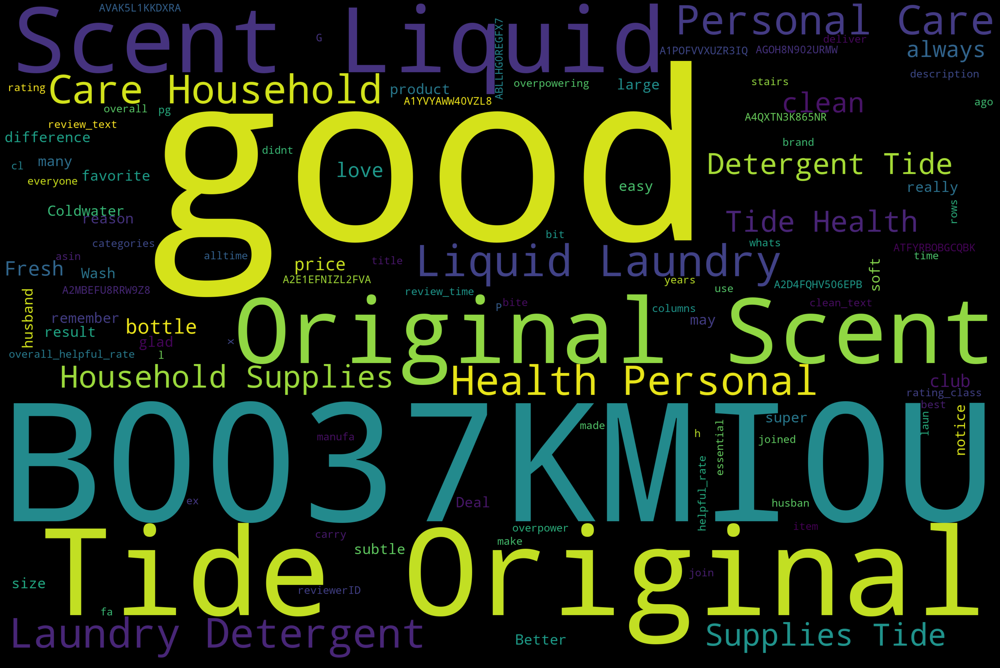

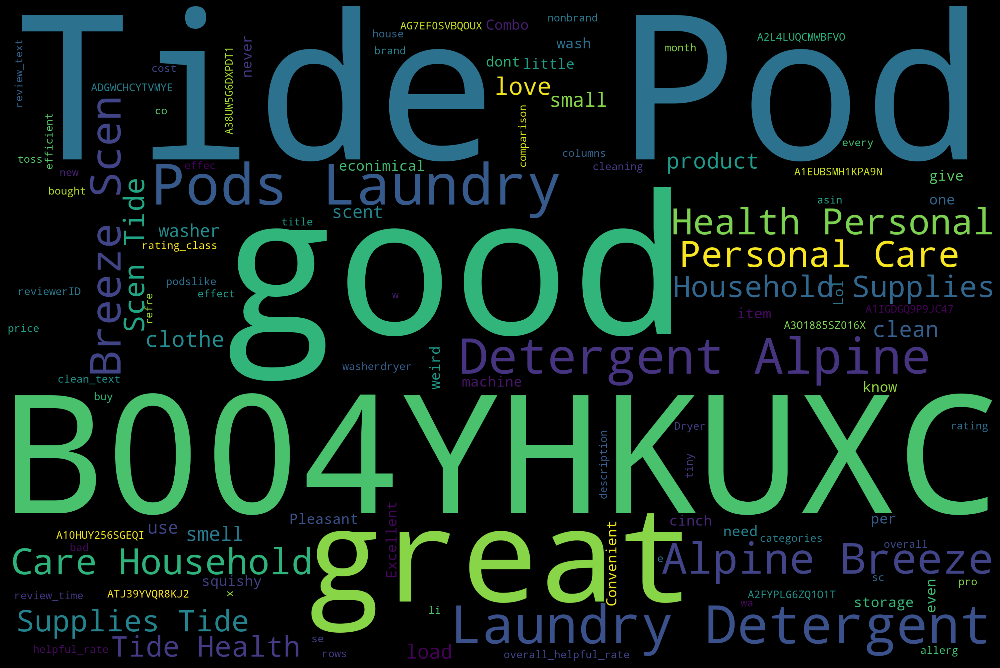

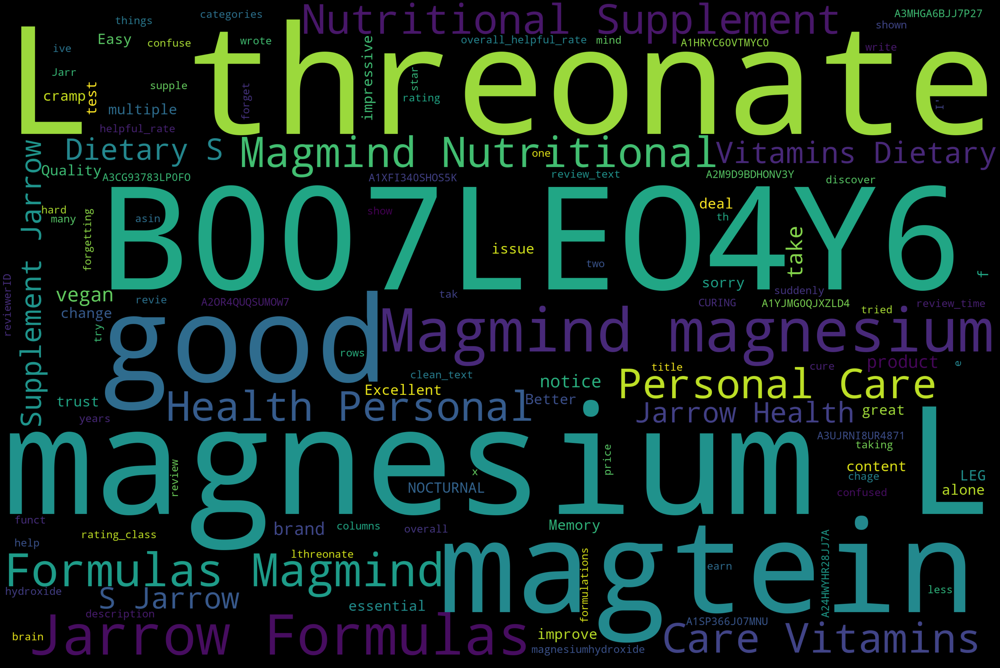

In [70]:
for asin in top_5_popular_with_img['asin']:
    plot_word_cloud(pd.DataFrame(product_reviews_df.loc[product_reviews_df['asin'] == asin]))

C:\Users\NA014KA\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


(array([0, 1, 2, 3, 4]), <a list of 5 Text xticklabel objects>)

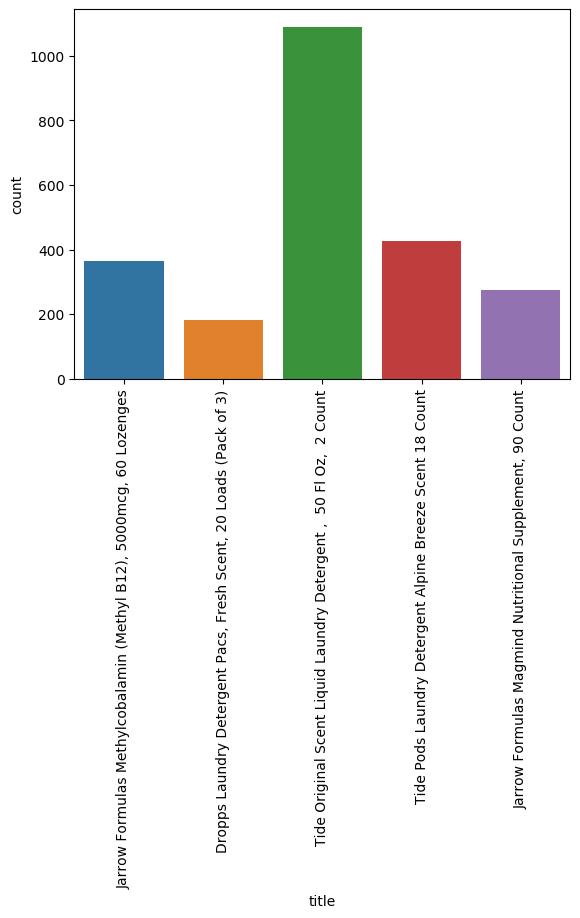

In [71]:
sns.countplot(top_5_product_reviews_df.title)
plt.xticks(rotation=90)

C:\Users\NA014KA\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


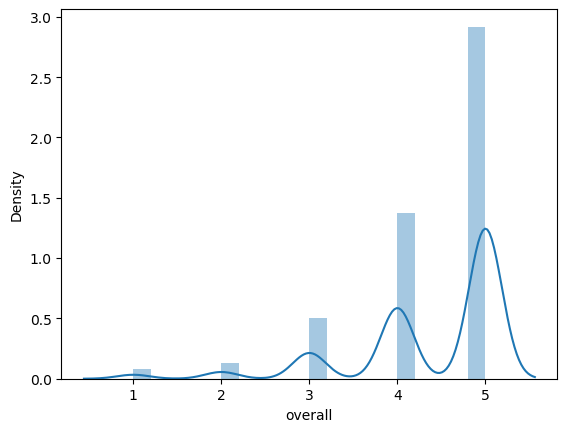

In [72]:
sns.distplot(top_5_product_reviews_df['overall'], bins=20)

C:\Users\NA014KA\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


(array([0, 1, 2, 3, 4]), <a list of 5 Text xticklabel objects>)

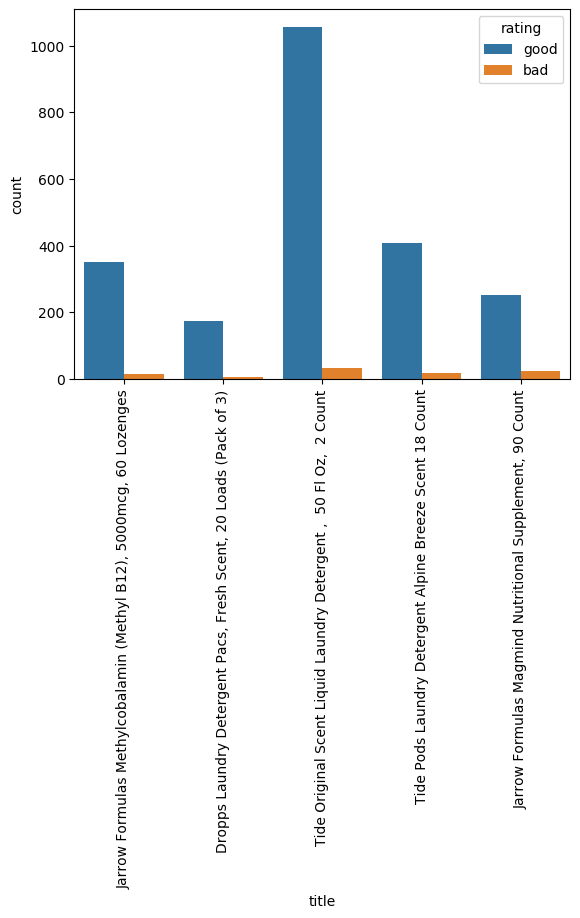

In [73]:
sns.countplot(top_5_product_reviews_df['title'], hue=top_5_product_reviews_df['rating'])
plt.xticks(rotation=90)

## Conclusion

By looking at the reviews count, rating distibution and wordcloud for the top selling products on amazon in given category we can suggest below to our investor,

    - "Tide Original Scent Liquid Laundry Detergent , 50 Fl Oz, 2 Count" is most widely used product with great positive reviews and rating while "Tide Pods Laundry Detergent Alpine Breeze Scent 18 Count" is the second highest in this range. 
    
    - "Jarrow Formulas Methylcobalamin (Methyl B12), 5000mcg, 60 Lozenges" is widely used for B12 followed by "Jarrow Formulas Magmind Nutritional Supplement, 90 Count"
    
    - "Dropps Laundry Detergent Pacs, Fresh Scent, 20 Loads (Pack of 3)" comes last in top 5 products to invest recommendation.
    
    - Most of our bad reviews were actual critic of product from the buyers, so we can consider these as feedback and can use to improve the product further to get more profit.
    
    - Liquid form of detergent is more popular than powder form, we can use this to diversify our investment into detergents. Also need to pay more attentions towards skin sensitivity along with smell, cleanliness, packsize, color, scent etc. properties